<a href="https://colab.research.google.com/github/roboto-eng/BOI_training-/blob/main/Module1_Lab.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Module 1 Lab: Python, Digital Image & Basic Image Processing
### หลักสูตร AI Vision & Deep Learning Basics — วันที่ 1 (29 สิงหาคม 2569)

## เป้าหมายการเรียนรู้

เมื่อทำแลปนี้จบ ผู้เรียนจะสามารถ:
1. เขียนโค้ด Python พื้นฐาน (ตัวแปร, ชนิดข้อมูล, เงื่อนไข, ลูป, ฟังก์ชัน) บน Google Colab ได้ด้วยตนเอง
2. อ่าน แสดงผล และบันทึกภาพด้วย OpenCV บน Google Colab ได้ พร้อมเข้าใจปัญหา BGR/RGB
3. ปรับความสว่าง/คอนทราสต์ และทำ Thresholding ภาพได้หลายวิธี (Binary, Otsu, Adaptive)
4. ลด Noise ด้วยเทคนิค Filtering พื้นฐาน และรู้ลำดับขั้นตอนที่ถูกต้องก่อนนำภาพไปตรวจจับจริง

**โครงสร้างไฟล์**
- **Part 1** — Python & Google Colab พื้นฐาน (~40 นาที)
- **Part 2** — อ่านและแสดงภาพด้วย OpenCV (~35 นาที)
- **Part 3** — Image Processing: Thresholding, Filtering, Noise (~60–70 นาที)

ภาพตัวอย่างมาจาก OpenCV samples (Apache-2.0)


In [3]:
# เซลล์นี้ต้องรันเป็นเซลล์แรกเสมอ (รันครั้งเดียวตอนเปิด Colab ใหม่)
# ทำ 3 อย่าง: (1) ติดตั้งไลบรารี (2) ดาวน์โหลดภาพตัวอย่าง (3) เตรียมฟอนต์ไทยสำหรับกราฟ

!pip install opencv-python-headless numpy matplotlib -q

import os
import glob
import urllib.request
import matplotlib.pyplot as plt
from matplotlib import font_manager

os.makedirs("images", exist_ok=True)
os.makedirs("fonts", exist_ok=True)

BASE_URL = "https://raw.githubusercontent.com/opencv/opencv/4.x/samples/data/"
image_files = ["board.jpg", "baboon.jpg", "smarties.png", "fruits.jpg", "detect_blob.png"]

print("กำลังดาวน์โหลดภาพตัวอย่าง...")
for filename in image_files:
    local_path = os.path.join("images", filename)
    urllib.request.urlretrieve(BASE_URL + filename, local_path)
    file_size_kb = os.path.getsize(local_path) / 1024
    print(f"  ดาวน์โหลดสำเร็จ: {filename} ({file_size_kb:.1f} KB)")

for filename in image_files:
    local_path = os.path.join("images", filename)
    assert os.path.exists(local_path), f"ไม่พบไฟล์ {filename} กรุณารันเซลล์นี้ใหม่อีกครั้ง"
    assert os.path.getsize(local_path) > 0, f"ไฟล์ {filename} มีขนาด 0 ไบต์ กรุณารันเซลล์นี้ใหม่อีกครั้ง"

# Matplotlib ไม่มีฟอนต์ไทยมาให้ ถ้าไม่ตั้งค่า ข้อความไทยบนกราฟจะกลายเป็นสี่เหลี่ยม
SARABUN_URL = ("https://raw.githubusercontent.com/google/fonts/main/"
               "ofl/sarabun/Sarabun-Regular.ttf")

def setup_thai_font() -> str:
    """เตรียมฟอนต์ไทยให้ Matplotlib แล้วคืนชื่อฟอนต์ที่ใช้ได้จริง"""
    installed_thai_fonts = (glob.glob("/usr/share/fonts/**/tlwg/*.ttf", recursive=True) +
                            glob.glob("/usr/share/fonts/**/tlwg/*.otf", recursive=True))
    sarabun_path = os.path.join("fonts", "Sarabun-Regular.ttf")
    if not os.path.exists(sarabun_path):
        try:
            urllib.request.urlretrieve(SARABUN_URL, sarabun_path)
        except Exception as download_error:
            print("  ! ดาวน์โหลดฟอนต์ Sarabun ไม่สำเร็จ:", download_error)

    candidate_font_paths = ([sarabun_path] if os.path.exists(sarabun_path) else []) \
                           + installed_thai_fonts
    for font_path in candidate_font_paths:
        try:
            font_manager.fontManager.addfont(font_path)
            font_name = font_manager.FontProperties(fname=font_path).get_name()
            return font_name
        except Exception:
            continue
    return ""

THAI_FONT_NAME = setup_thai_font()
if THAI_FONT_NAME:
    plt.rcParams["font.family"] = THAI_FONT_NAME
    print(f"  ✔ ฟอนต์ไทยของกราฟ: {THAI_FONT_NAME}")
else:
    print("  ! ไม่พบฟอนต์ไทย ข้อความไทยบนกราฟอาจแสดงเป็นสี่เหลี่ยม (โค้ดส่วนอื่นยังทำงานปกติ)")

plt.rcParams["axes.unicode_minus"] = False
plt.rcParams["figure.dpi"] = 110

print("\nดาวน์โหลดภาพตัวอย่างครบทุกไฟล์แล้ว พร้อมเริ่มเรียน Part 1 ได้เลย!")


กำลังดาวน์โหลดภาพตัวอย่าง...
  ดาวน์โหลดสำเร็จ: board.jpg (118.7 KB)
  ดาวน์โหลดสำเร็จ: baboon.jpg (175.7 KB)
  ดาวน์โหลดสำเร็จ: smarties.png (88.7 KB)
  ดาวน์โหลดสำเร็จ: fruits.jpg (80.5 KB)
  ดาวน์โหลดสำเร็จ: detect_blob.png (33.3 KB)
  ✔ ฟอนต์ไทยของกราฟ: Sarabun

ดาวน์โหลดภาพตัวอย่างครบทุกไฟล์แล้ว พร้อมเริ่มเรียน Part 1 ได้เลย!


---
# Part 1: Python & Google Colab พื้นฐาน (ใช้เวลาประมาณ 40 นาที)

เราจะเรียนรู้พื้นฐาน Python ที่จำเป็นสำหรับงาน Image Processing: ตัวแปร, ชนิดข้อมูล, เงื่อนไข, ลูป, และฟังก์ชัน


## ส่วน A: ตัวแปรและชนิดข้อมูล (Variable & Data Type) — ประมาณ 15 นาที

ตัวแปร (Variable) คือ "กล่องเก็บค่า" ที่เราตั้งชื่อไว้ใช้งานภายหลัง ส่วนชนิดข้อมูล (Data Type) บอกว่าค่าที่เก็บอยู่นั้นเป็นแบบไหน


In [ ]:
# ===== ตัวแปรคืออะไร =====
# บรรทัดล่างนี้คือการ "สร้างกล่องชื่อ a แล้วใส่เลข 2 ลงไป"
a = 2
print("ค่าของ a คือ:", a)

# Python รู้ชนิดข้อมูลของตัวแปรโดยอัตโนมัติ ไม่ต้องบอกล่วงหน้าว่าเป็นชนิดอะไร
# คำสั่ง type() ใช้เช็คว่าตัวแปรนั้นเป็นชนิดข้อมูลอะไร
print("ชนิดข้อมูลของ a คือ:", type(a))


ค่าของ a คือ: 2
ชนิดข้อมูลของ a คือ: <class 'int'>


In [ ]:
# ===== ชนิดข้อมูลพื้นฐาน 4 แบบ พร้อมตัวอย่างจากงานโรงงาน =====

# 1) int (จำนวนเต็ม) เช่น จำนวนชิ้นงานที่ผลิตได้ในกะนี้
part_count = 150
print("จำนวนชิ้นงาน:", part_count, "| ชนิดข้อมูล:", type(part_count))

# 2) float (ทศนิยม) เช่น น้ำหนักของชิ้นงาน (กิโลกรัม)
part_weight = 3.2
print("น้ำหนักชิ้นงาน:", part_weight, "กก. | ชนิดข้อมูล:", type(part_weight))

# 3) str (ข้อความ/สตริง) เช่น ชื่อรุ่นสินค้า ต้องเขียนในเครื่องหมายคำพูด "..." หรือ '...'
model_name = "Bolt-M6"
print("ชื่อรุ่น:", model_name, "| ชนิดข้อมูล:", type(model_name))

# 4) bool (ค่าจริง/เท็จ) เช่น สถานะผ่าน QC หรือไม่ (มีแค่ True กับ False เท่านั้น)
passed_qc = True
print("ผ่าน QC หรือไม่:", passed_qc, "| ชนิดข้อมูล:", type(passed_qc))


จำนวนชิ้นงาน: 150 | ชนิดข้อมูล: <class 'int'>
น้ำหนักชิ้นงาน: 3.2 กก. | ชนิดข้อมูล: <class 'float'>
ชื่อรุ่น: Bolt-M6 | ชนิดข้อมูล: <class 'str'>
ผ่าน QC หรือไม่: True | ชนิดข้อมูล: <class 'bool'>


### 🔧 ลองเปลี่ยนค่าดู
ลองแก้โค้ดในเซลล์ข้างล่างนี้: เปลี่ยนชื่อตัวแปร เปลี่ยนค่า แล้วกด Shift+Enter ดูผลลัพธ์ที่เปลี่ยนไป


In [ ]:
# ===== พื้นที่ให้ทดลอง =====
# ลองสร้างตัวแปรของตัวเอง 4 ตัว ให้ครบทั้ง int, float, str, bool แล้ว print() ดูผลลัพธ์
my_name = "ใส่ชื่อของคุณที่นี่"   # <- แก้ตรงนี้
years_of_work = 5                  # <- แก้ตรงนี้ (หน่วยเป็นปี)

print("สวัสดี", my_name, "ทำงานมาแล้ว", years_of_work, "ปี")


สวัสดี ใส่ชื่อของคุณที่นี่ ทำงานมาแล้ว 5 ปี


## ส่วน B: List, เงื่อนไข if-else, และลูป for — ประมาณ 15 นาที

List ใช้เก็บค่าหลายค่าในตัวแปรเดียว, if-else ใช้ตัดสินใจ, for loop ใช้ทำงานซ้ำ ๆ โดยไม่ต้องเขียนโค้ดซ้ำเอง


In [ ]:
# ===== List (ลิสต์) =====
# List คือชุดของค่าหลายค่าเก็บในตัวแปรเดียว เข้าถึงแต่ละค่าด้วย "index" ซึ่งเริ่มนับจาก 0 เสมอ
part_list = ["Bolt-M6", "Nut-M6", "Washer", "Screw-M8"]

print("ชิ้นงานตัวแรก (index 0):", part_list[0])
print("ชิ้นงานตัวที่สอง (index 1):", part_list[1])
print("จำนวนชิ้นงานทั้งหมดในลิสต์:", len(part_list))

# ทำไม List สำคัญกับงาน Vision: ใช้เก็บพิกัดกรอบวัตถุ (bounding box) ที่ AI ตรวจจับได้ เช่น
bbox = [120, 45, 300, 210]  # [x1, y1, x2, y2]
print("พิกัดกรอบวัตถุ:", bbox)


ชิ้นงานตัวแรก (index 0): Bolt-M6
ชิ้นงานตัวที่สอง (index 1): Nut-M6
จำนวนชิ้นงานทั้งหมดในลิสต์: 4
พิกัดกรอบวัตถุ: [120, 45, 300, 210]


In [ ]:
# ===== เงื่อนไข if...else =====
# ใช้ตัดสินใจว่าจะทำอะไรตามเงื่อนไขที่กำหนด
defect_score = 8
pass_threshold = 5

if defect_score > pass_threshold:
    print("ผลตรวจสอบ: ไม่ผ่าน QC (คะแนนตำหนิเกินเกณฑ์)")
else:
    print("ผลตรวจสอบ: ผ่าน QC")

# 🔧 ลองเปลี่ยนค่า "defect_score" ด้านบนเป็น 3 แล้วรันใหม่ดูว่าผลลัพธ์เปลี่ยนไปอย่างไร


ผลตรวจสอบ: ไม่ผ่าน QC (คะแนนตำหนิเกินเกณฑ์)


In [ ]:
# ===== ลูป for =====
# for loop ใช้ทำงานซ้ำกับสมาชิกทุกตัวใน list โดยไม่ต้องเขียนคำสั่งซ้ำเอง
part_list = ["Bolt-M6", "Nut-M6", "Washer"]

for part in part_list:
    print("กำลังตรวจสอบ:", part)

print("ตรวจสอบครบทุกชิ้นแล้ว")

# ลองนึกภาพ: ถ้าต้องตรวจสอบชิ้นงาน 1,000 ชิ้นในไลน์การผลิต
# การเขียน print() ทีละบรรทัด 1,000 ครั้งคงไม่ไหว แต่ for loop ทำแทนได้ในไม่กี่บรรทัด


กำลังตรวจสอบ: Bolt-M6
กำลังตรวจสอบ: Nut-M6
กำลังตรวจสอบ: Washer
ตรวจสอบครบทุกชิ้นแล้ว


## ส่วน C: ฟังก์ชัน (Function) + แบบฝึกหัด — ประมาณ 10 นาที

ฟังก์ชันคือชุดคำสั่งที่ตั้งชื่อไว้ใช้ซ้ำได้ โดยไม่ต้องเขียนโค้ดเดิมซ้ำหลายที่ เปรียบเหมือน "เครื่องจักรสำเร็จรูป": ใส่วัตถุดิบเข้าไป (input) ได้ผลลัพธ์ออกมา (output)


In [ ]:
# ===== ฟังก์ชัน (Function) =====
def sum_numbers(numbers):
    total = 0
    for number in numbers:
        total = total + number
    return total

# เรียกใช้ฟังก์ชันที่สร้างไว้
result = sum_numbers([1, 2, 3, 4, 5])
print("ผลรวมคือ:", result)

# ทำไมฟังก์ชันสำคัญ: ในช่วงบ่ายเราจะใช้ YOLOv11 ซึ่งก็คือ "ฟังก์ชันสำเร็จรูปขนาดใหญ่"
# ที่รับภาพเข้าไป (input) แล้วให้ผลการตรวจจับวัตถุออกมา (output) โดยไม่ต้องรู้รายละเอียดข้างในทุกครั้ง


ผลรวมคือ: 15


### ✅ แบบฝึกหัดท้าย Part 1
ลองเขียนฟังก์ชันชื่อ `check_qc` ที่รับค่า "คะแนนตำหนิ" เป็น input แล้ว return ข้อความ "ผ่าน" หรือ "ไม่ผ่าน" ตามเกณฑ์ 5 คะแนน (ใช้ความรู้จาก Section B และ C รวมกัน)



In [ ]:
# ===== แบบฝึกหัด: เขียนฟังก์ชันของตัวเอง =====
def check_qc(defect_score):
    # TODO: เติมโค้ดตรงนี้ ใช้ if...else แล้ว return "ผ่าน" หรือ "ไม่ผ่าน"
    pass

# ทดสอบฟังก์ชันที่เขียน (ควรได้ผลลัพธ์ "ไม่ผ่าน" และ "ผ่าน" ตามลำดับ)
print(check_qc(8))
print(check_qc(2))


None
None


---
# Part 2: อ่านและแสดงภาพด้วย OpenCV บน Google Colab (ใช้เวลาประมาณ 35 นาที)

เราจะเรียนรู้ว่าภาพดิจิทัลถูกเก็บในคอมพิวเตอร์อย่างไร และใช้ OpenCV อ่าน/แสดง/บันทึกภาพบน Colab


## ส่วน A: อ่าน แสดงผล และบันทึกภาพด้วย OpenCV — ประมาณ 15 นาที

**สำคัญมาก:** บน Google Colab คำสั่ง `cv2.imshow()` แบบปกติ **ใช้ไม่ได้** เพราะ Colab ไม่มีหน้าต่างแสดงผลของเครื่อง
ต้องใช้ฟังก์ชันพิเศษของ Google แทน คือ `cv2_imshow()`


ชนิดข้อมูลของตัวแปร img คือ: <class 'numpy.ndarray'>
ขนาดของภาพ (shape): (480, 640, 3)


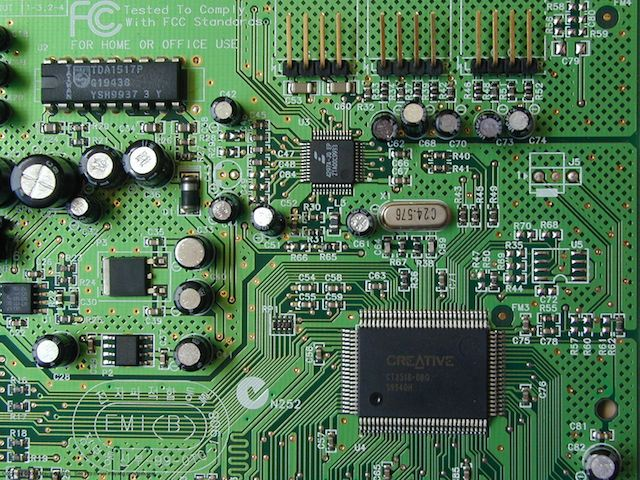

In [5]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow   # ฟังก์ชันพิเศษสำหรับแสดงภาพบน Colab เท่านั้น

# ===== อ่านภาพด้วย cv2.imread() =====
img = cv2.imread("images/board.jpg")

# เช็คว่าอ่านภาพสำเร็จหรือไม่ (ถ้า path ผิด cv2.imread จะคืนค่า None แทนที่จะฟ้อง error)
assert img is not None, "อ่านภาพไม่สำเร็จ กรุณาตรวจสอบว่ารันเซลล์ดาวน์โหลดภาพ (เซลล์ที่ 2) แล้วหรือยัง"

print("ชนิดข้อมูลของตัวแปร img คือ:", type(img))
print("ขนาดของภาพ (shape):", img.shape)

# ===== แสดงภาพด้วย cv2_imshow() (เฉพาะบน Colab) =====
cv2_imshow(img)


In [ ]:
# ===== บันทึกภาพด้วย cv2.imwrite() =====
# สร้างโฟลเดอร์เก็บผลลัพธ์ไว้ล่วงหน้า จะใช้ตลอดทั้งไฟล์นี้
import os
os.makedirs("output", exist_ok=True)

cv2.imwrite("output/board_copy.jpg", img)
print("บันทึกภาพสำเร็จที่ output/board_copy.jpg")

# ลองเปิดแถบไฟล์ทางซ้ายของ Colab (ไอคอนรูปโฟลเดอร์) แล้วดูว่ามีไฟล์นี้ปรากฏขึ้นจริงหรือไม่


บันทึกภาพสำเร็จที่ output/board_copy.jpg


## ส่วน B: shape, การเข้าถึงพิกเซล, และปัญหา BGR vs RGB — ประมาณ 10 นาที

ข้อควรระวังที่ผู้เริ่มต้นใช้ OpenCV พลาดบ่อยที่สุด: **OpenCV เก็บภาพสีด้วยลำดับ BGR ไม่ใช่ RGB**


In [ ]:
# ===== shape ของภาพ =====
print("shape ของภาพ (สูง, กว้าง, จำนวนแชนแนลสี):", img.shape)
height, width, channels = img.shape
print(f"ภาพนี้สูง {height} พิกเซล, กว้าง {width} พิกเซล, มี {channels} แชนแนลสี")

# ===== เข้าถึงค่าพิกเซลตำแหน่งหนึ่ง =====
# ลองดูค่าพิกเซลตำแหน่ง (0,0) คือมุมบนซ้ายของภาพ
print("ค่าพิกเซลตำแหน่ง (0,0):", img[0, 0], "<- นี่คือค่า [B, G, R] ไม่ใช่ [R, G, B]!")


shape ของภาพ (สูง, กว้าง, จำนวนแชนแนลสี): (480, 640, 3)
ภาพนี้สูง 480 พิกเซล, กว้าง 640 พิกเซล, มี 3 แชนแนลสี
ค่าพิกเซลตำแหน่ง (0,0): [138 211 139] <- นี่คือค่า [B, G, R] ไม่ใช่ [R, G, B]!


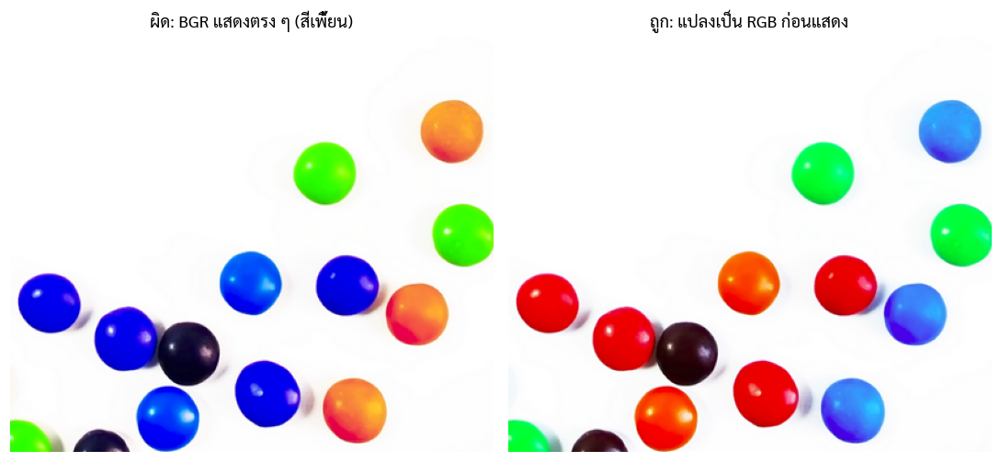

บันทึกภาพเปรียบเทียบ BGR vs RGB ไว้ที่ output/part2_bgr_vs_rgb.png


In [ ]:
# ===== ปัญหา BGR vs RGB =====
# ลองใช้ภาพสีสด ๆ (สมาร์ตี้ / ลูกกวาดสีสัน) เพื่อให้เห็นความต่างชัดเจน
smarties = cv2.imread("images/smarties.png")

fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# แสดงแบบผิด: เอาภาพจาก OpenCV (BGR) ไปแสดงตรง ๆ ด้วย Matplotlib (ซึ่งตีความเป็น RGB) -> สีเพี้ยน
axes[0].imshow(smarties)
axes[0].set_title("ผิด: BGR แสดงตรง ๆ (สีเพี้ยน)")
axes[0].axis("off")

# แสดงแบบถูก: แปลง BGR -> RGB ก่อนด้วย cv2.cvtColor()
smarties_rgb = cv2.cvtColor(smarties, cv2.COLOR_BGR2RGB)
axes[1].imshow(smarties_rgb)
axes[1].set_title("ถูก: แปลงเป็น RGB ก่อนแสดง")
axes[1].axis("off")

plt.tight_layout()
plt.savefig("output/part2_bgr_vs_rgb.png", dpi=120)
plt.show()

print("บันทึกภาพเปรียบเทียบ BGR vs RGB ไว้ที่ output/part2_bgr_vs_rgb.png")


shape ของภาพ grayscale: (480, 640) <- สังเกตว่าเหลือแค่ 2 มิติ ไม่มีแชนแนลสีแล้ว


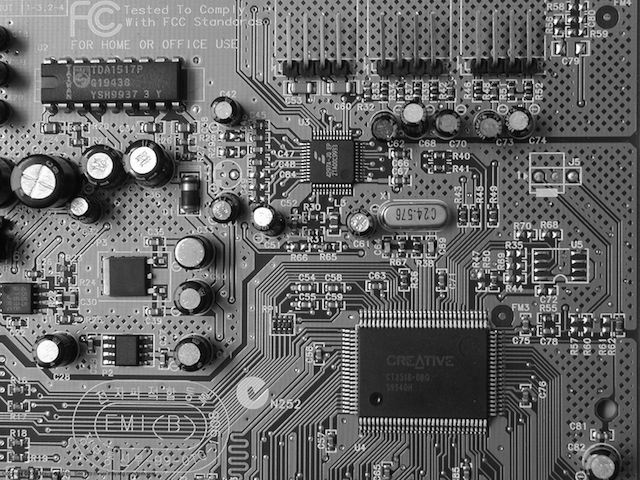

In [ ]:
# ===== แปลงเป็น Grayscale ด้วย cv2.cvtColor() =====
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
print("shape ของภาพ grayscale:", gray.shape, "<- สังเกตว่าเหลือแค่ 2 มิติ ไม่มีแชนแนลสีแล้ว")

cv2_imshow(gray)


## ส่วน C: แบบฝึกหัด + เช็คความเข้าใจ — ประมาณ 10 นาที

### 🔧 ลองเปลี่ยนค่าดู
ลองเปลี่ยนชื่อไฟล์ภาพในโค้ดข้างล่างเป็น `"images/baboon.jpg"` หรือ `"images/fruits.jpg"` แล้วรันดูผลลัพธ์


shape: (480, 640, 3)


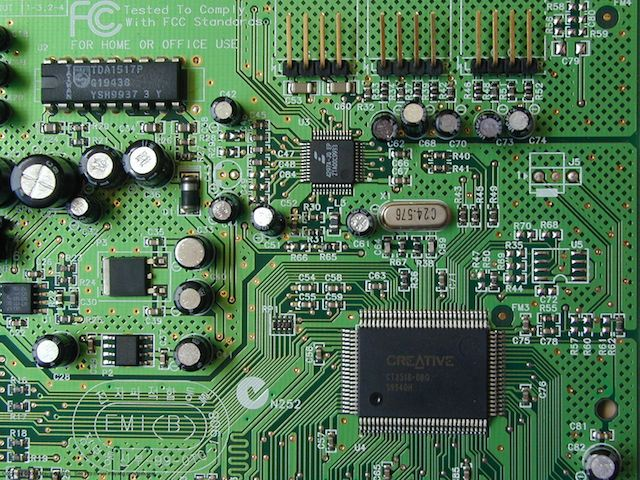

In [ ]:
# ===== พื้นที่ให้ทดลอง =====
selected_image = "images/board.jpg"   # <- ลองเปลี่ยนเป็นไฟล์อื่นดู

img_try = cv2.imread(selected_image)
print("shape:", img_try.shape)
cv2_imshow(img_try)


### ✅ เช็คความเข้าใจก่อนไป Part 3
1) ทำไมต้องใช้ `cv2_imshow()` แทน `cv2.imshow()` บน Colab?
2) ภาพสีมีกี่แชนแนล อะไรบ้าง?
3) OpenCV อ่านลำดับสีเป็นแบบใด (BGR หรือ RGB)?
4) ถ้า `cv2.imread()` อ่านภาพไม่สำเร็จ ตัวแปรที่ได้จะมีค่าเป็นอะไร?

(ลองตอบในใจหรือจดคำตอบไว้ก่อนเลื่อนไป Part 3 — ถ้าตอบข้อไหนไม่ได้ ให้กลับไปอ่านเซลล์ที่เกี่ยวข้องด้านบนอีกครั้ง)


---
# Part 3: Image Processing — Thresholding, Filtering, Noise (ใช้เวลาประมาณ 60–70 นาที)

แค่ "อ่านภาพ" ยังไม่พอสำหรับงานตรวจสอบจริง — ภาพจากกล้องหน้างานมักมีแสงไม่สม่ำเสมอและมี noise ปนอยู่
Part นี้จะสอนวิธีจัดการภาพ (Image Processing) เพื่อเตรียมภาพให้พร้อมก่อนนำไปตรวจจับ — **เป้าหมายคือทำให้คอมพิวเตอร์ตัดสินใจง่ายขึ้น ไม่ใช่ทำให้ภาพดูสวยขึ้น**


## ส่วน A: ปรับความสว่าง/คอนทราสต์ และ Simple Thresholding — ประมาณ 20–25 นาที

**Point Operation** = การปรับค่าพิกเซลทีละจุดอย่างอิสระ ไม่สนใจพิกเซลข้างเคียง


shape ของภาพ grayscale ที่จะใช้ตลอด Part 3: (480, 640)


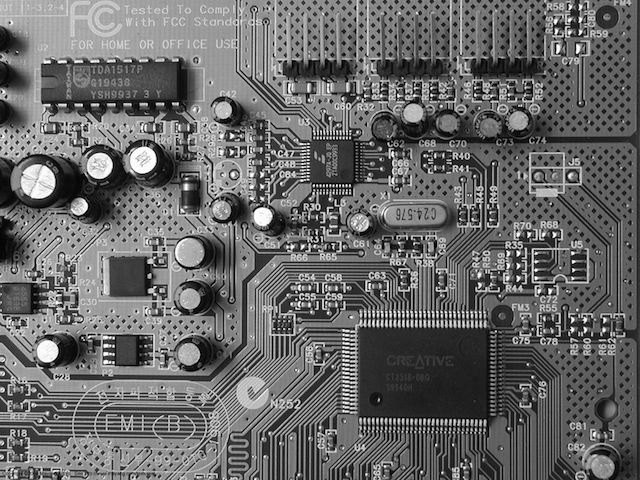

In [ ]:
# ===== เตรียมภาพ grayscale ไว้ใช้ตลอด Part 3 =====
gray = cv2.imread("images/board.jpg", cv2.IMREAD_GRAYSCALE)
assert gray is not None, "อ่านภาพไม่สำเร็จ ตรวจสอบเซลล์ดาวน์โหลดภาพอีกครั้ง"
print("shape ของภาพ grayscale ที่จะใช้ตลอด Part 3:", gray.shape)
cv2_imshow(gray)


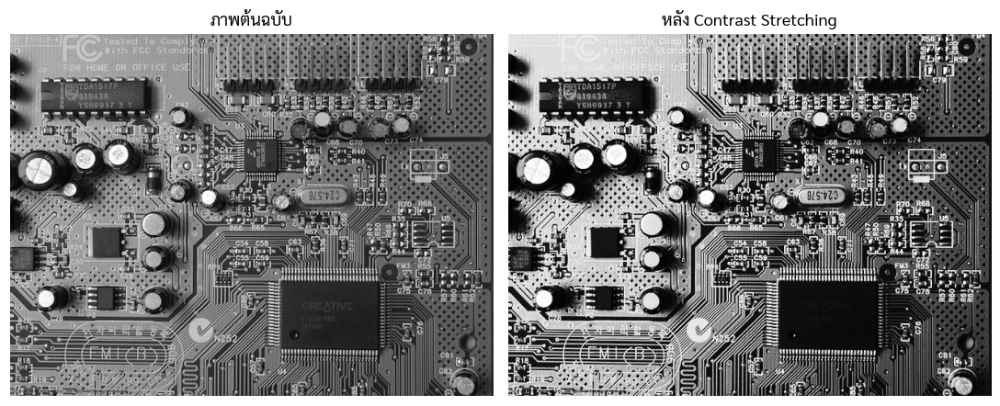

In [ ]:
# ===== Contrast Stretching (Point Operation แบบ piecewise-linear) =====
# แนวคิด: ขยายช่วงค่าความสว่างให้กว้างเต็มช่วง 0-255
# กำหนดจุด (r1,s1) และ (r2,s2) เป็นเส้นตรง 3 ช่วง ตามสูตร s = m*r + c ในแต่ละช่วง
m, n = gray.shape
r1, s1 = 75, 25
r2, s2 = 160, 220

stretched = np.empty([m, n])
for i in range(m):
    for j in range(n):
        pixel = gray[i, j]
        if 0 <= pixel <= r1:
            stretched[i, j] = (s1 / r1) * pixel
        elif r1 < pixel <= r2:
            stretched[i, j] = ((s2 - s1) / (r2 - r1)) * (pixel - r1) + s1
        else:
            stretched[i, j] = ((255 - s2) / (255 - r2)) * (pixel - r2) + s2

fig, axes = plt.subplots(1, 2, figsize=(10, 5))
axes[0].imshow(gray, cmap="gray"); axes[0].set_title("ภาพต้นฉบับ"); axes[0].axis("off")
axes[1].imshow(stretched, cmap="gray"); axes[1].set_title("หลัง Contrast Stretching"); axes[1].axis("off")
plt.tight_layout()
plt.savefig("output/part3_contrast_stretch.png", dpi=120)
plt.show()

# หมายเหตุ: โค้ดแบบวนลูปทีละพิกเซลนี้ช้า ใช้เพื่อให้เห็นหลักการชัดเจน
# ในงานจริงใช้ cv2.convertScaleAbs() จะเร็วกว่านี้มาก


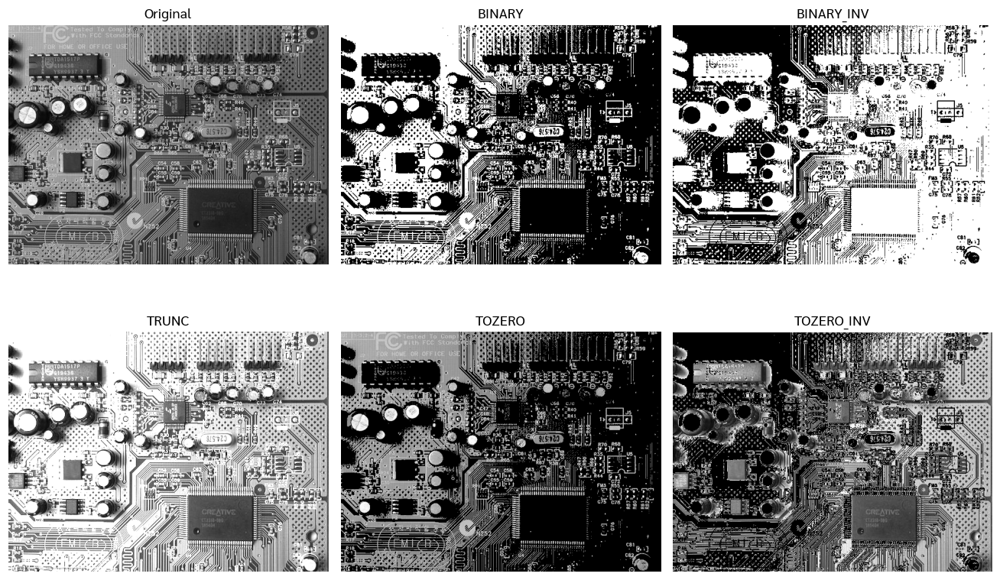

บันทึกภาพเปรียบเทียบ 5 แบบไว้ที่ output/part3_threshold_5types.png


In [ ]:
# ===== Simple Thresholding 5 แบบ =====
T = 127  # ค่าตัดสิน (threshold)

_, th_binary      = cv2.threshold(gray, T, 255, cv2.THRESH_BINARY)
_, th_binary_inv  = cv2.threshold(gray, T, 255, cv2.THRESH_BINARY_INV)
_, th_trunc       = cv2.threshold(gray, T, 255, cv2.THRESH_TRUNC)
_, th_tozero      = cv2.threshold(gray, T, 255, cv2.THRESH_TOZERO)
_, th_tozero_inv  = cv2.threshold(gray, T, 255, cv2.THRESH_TOZERO_INV)

images = [gray, th_binary, th_binary_inv, th_trunc, th_tozero, th_tozero_inv]
titles = ["Original", "BINARY", "BINARY_INV", "TRUNC", "TOZERO", "TOZERO_INV"]

fig, axes = plt.subplots(2, 3, figsize=(12, 8))
for ax, im, title in zip(axes.flat, images, titles):
    ax.imshow(im, cmap="gray")
    ax.set_title(title)
    ax.axis("off")
plt.tight_layout()
plt.savefig("output/part3_threshold_5types.png", dpi=120)
plt.show()

print("บันทึกภาพเปรียบเทียบ 5 แบบไว้ที่ output/part3_threshold_5types.png")


### 🔧 ลองเปลี่ยนค่าดู
ลองเปลี่ยนค่า `T` ในเซลล์ threshold ด้านบนเป็น 63 หรือ 191 แล้วรันใหม่ ดูว่าภาพผลลัพธ์เปลี่ยนไปอย่างไร


## ส่วน B: Adaptive & Otsu Thresholding และ Noise — ประมาณ 20–25 นาที

**ปัญหาของ Threshold ค่าเดียว (Global Threshold):** ถ้าแสงในภาพไม่สม่ำเสมอ ค่า T เดียวจะตัดผิดพลาดทันที
ในโรงงาน: นี่คือสาเหตุที่ระบบตรวจจับทำงานดีตอนเช้าแต่เริ่มพลาดตอนบ่าย ทั้งที่ไม่ได้แก้โค้ดอะไรเลย


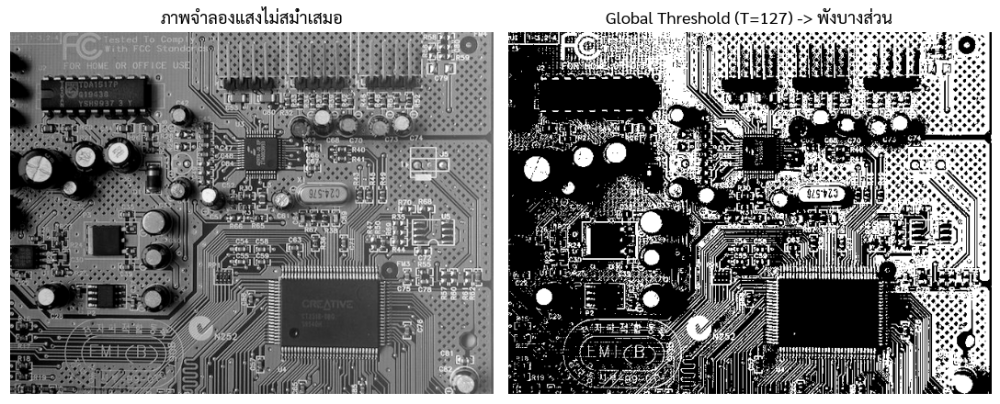

In [ ]:
# ===== จำลองภาพที่แสงไม่สม่ำเสมอ (สร้าง gradient แสงจำลอง เพื่อสาธิตปัญหา) =====
# หมายเหตุ: นี่คือการ "จำลอง" สภาพแสงไม่สม่ำเสมอด้วยโค้ด ไม่ใช่ภาพถ่ายจริงจากหน้างาน
light_gradient = np.tile(np.linspace(-60, 60, n), (m, 1)).astype(np.int16)
gray_uneven = np.clip(gray.astype(np.int16) + light_gradient, 0, 255).astype(np.uint8)

# ลอง threshold ค่าเดียว (global) กับภาพที่แสงไม่สม่ำเสมอ -> จะเห็นปัญหาชัดเจน
_, th_global_uneven = cv2.threshold(gray_uneven, 127, 255, cv2.THRESH_BINARY)

fig, axes = plt.subplots(1, 2, figsize=(10, 5))
axes[0].imshow(gray_uneven, cmap="gray"); axes[0].set_title("ภาพจำลองแสงไม่สม่ำเสมอ"); axes[0].axis("off")
axes[1].imshow(th_global_uneven, cmap="gray"); axes[1].set_title("Global Threshold (T=127) -> พังบางส่วน"); axes[1].axis("off")
plt.tight_layout()
plt.savefig("output/part3_global_threshold_problem.png", dpi=120)
plt.show()


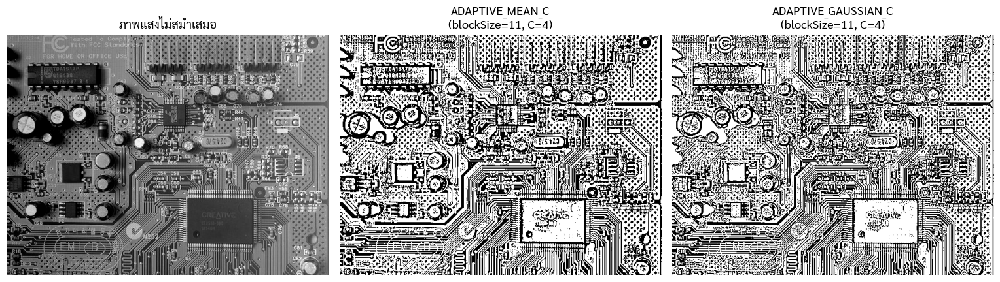

สังเกต: Adaptive Threshold แก้ปัญหาแสงไม่สม่ำเสมอได้ดีกว่า Global Threshold มาก


In [ ]:
# ===== Adaptive Thresholding: แก้ปัญหาแสงไม่สม่ำเสมอ =====
# blockSize = ขนาดพื้นที่ย่อยที่ใช้คำนวณค่าเฉลี่ย (ต้องเป็นเลขคี่), C = ค่าคงที่ที่นำไปลบออกจากค่าเฉลี่ย
blockSize = 11
C = 4

adaptive_mean = cv2.adaptiveThreshold(
    gray_uneven, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, blockSize, C
)
adaptive_gaussian = cv2.adaptiveThreshold(
    gray_uneven, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, blockSize, C
)

fig, axes = plt.subplots(1, 3, figsize=(14, 5))
axes[0].imshow(gray_uneven, cmap="gray"); axes[0].set_title("ภาพแสงไม่สม่ำเสมอ"); axes[0].axis("off")
axes[1].imshow(adaptive_mean, cmap="gray"); axes[1].set_title(f"ADAPTIVE_MEAN_C\n(blockSize={blockSize}, C={C})"); axes[1].axis("off")
axes[2].imshow(adaptive_gaussian, cmap="gray"); axes[2].set_title(f"ADAPTIVE_GAUSSIAN_C\n(blockSize={blockSize}, C={C})"); axes[2].axis("off")
plt.tight_layout()
plt.savefig("output/part3_adaptive_threshold.png", dpi=120)
plt.show()

print("สังเกต: Adaptive Threshold แก้ปัญหาแสงไม่สม่ำเสมอได้ดีกว่า Global Threshold มาก")


### 🔧 ลองเปลี่ยนค่าดู
ลองเปลี่ยน `blockSize` เป็น 3 (เล็กมาก) หรือ 51 (ใหญ่มาก) แล้วสังเกตความแตกต่าง — blockSize เล็กเกินไปจะไวต่อ noise, ใหญ่เกินไปจะเหมือนกลับไปเป็น global threshold


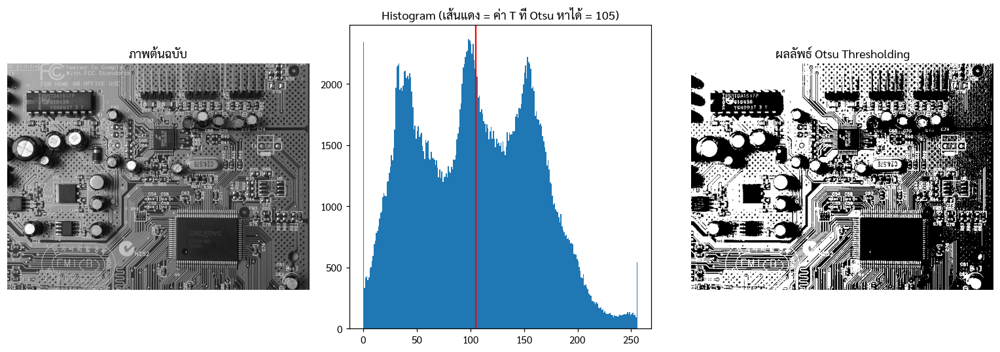

ค่า Threshold ที่ Otsu คำนวณได้อัตโนมัติ: 105
ใช้ Otsu เมื่อ: ความสว่างเปลี่ยนไปทีละล็อตการผลิต แต่พื้นหลังกับวัตถุยังแยกออกจากกันชัดเจนในแต่ละภาพ


In [ ]:
# ===== Otsu's Thresholding: ให้คอมพิวเตอร์หาค่า T เองจาก histogram =====
otsu_value, th_otsu = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

fig, axes = plt.subplots(1, 3, figsize=(14, 5))
axes[0].imshow(gray, cmap="gray"); axes[0].set_title("ภาพต้นฉบับ"); axes[0].axis("off")
axes[1].hist(gray.ravel(), bins=256, range=(0, 256)); axes[1].axvline(otsu_value, color="red")
axes[1].set_title(f"Histogram (เส้นแดง = ค่า T ที่ Otsu หาได้ = {otsu_value:.0f})")
axes[2].imshow(th_otsu, cmap="gray"); axes[2].set_title("ผลลัพธ์ Otsu Thresholding"); axes[2].axis("off")
plt.tight_layout()
plt.savefig("output/part3_otsu_threshold.png", dpi=120)
plt.show()

print(f"ค่า Threshold ที่ Otsu คำนวณได้อัตโนมัติ: {otsu_value:.0f}")
print("ใช้ Otsu เมื่อ: ความสว่างเปลี่ยนไปทีละล็อตการผลิต แต่พื้นหลังกับวัตถุยังแยกออกจากกันชัดเจนในแต่ละภาพ")


### ตารางเลือกวิธี Thresholding

| สถานการณ์ | วิธีที่แนะนำ |
|---|---|
| แสงสม่ำเสมอทั้งภาพ รู้ค่า T ที่เหมาะสมอยู่แล้ว | Binary Thresholding (กำหนด T เอง) |
| ต้องการภาพกลับด้าน (วัตถุมืดบนพื้นหลังสว่าง) | Binary Inverse Thresholding |
| แสงสม่ำเสมอในแต่ละภาพ แต่เปลี่ยนไปทีละล็อต ไม่อยากตั้งค่า T เอง | Otsu's Thresholding |
| แสงไม่สม่ำเสมอภายในภาพเดียวกัน (มีเงา/แสงเฉียง) | Adaptive Thresholding |


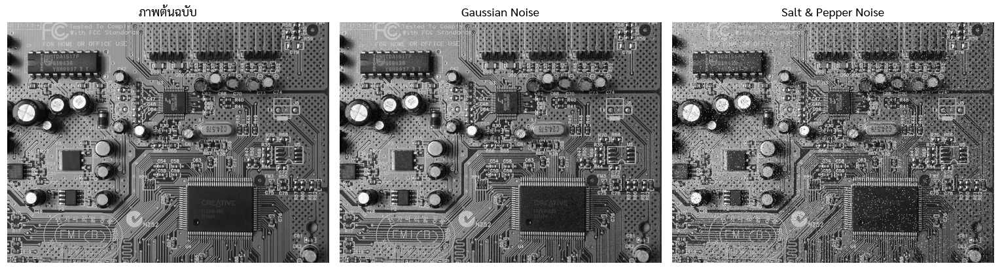

สาเหตุของ noise: ชนิดเซนเซอร์กล้อง (CMOS มี noise มากกว่า CCD), แสงน้อยขณะถ่ายภาพ,
และความผิดพลาดของสัญญาณ (เช่น การแปลงสัญญาณอนาล็อกเป็นดิจิทัล)


In [ ]:
# ===== สร้าง Noise จำลอง: Gaussian Noise และ Salt & Pepper Noise =====
# หมายเหตุ: นี่คือการ "จำลอง noise" ด้วยโค้ด เพื่อสาธิตเทคนิคการลด noise ในส่วนถัดไป

# --- Gaussian Noise: เพิ่มค่าสุ่มแบบ Gaussian distribution (mean=0, std=10) ---
noise_gaussian = np.random.normal(0, 10, gray.shape)
gray_gaussian_noisy = np.clip(gray.astype(np.float64) + noise_gaussian, 0, 255).astype(np.uint8)

# --- Salt & Pepper Noise: สุ่มเปลี่ยนบางพิกเซลเป็นขาวจัด/ดำจัด ---
gray_sp_noisy = gray.copy()
prob = 0.05
probs = np.random.random(gray.shape[:2])
gray_sp_noisy[probs < (prob / 2)] = 0        # pepper (จุดดำ)
gray_sp_noisy[probs > 1 - (prob / 2)] = 255  # salt (จุดขาว)

fig, axes = plt.subplots(1, 3, figsize=(14, 5))
axes[0].imshow(gray, cmap="gray"); axes[0].set_title("ภาพต้นฉบับ"); axes[0].axis("off")
axes[1].imshow(gray_gaussian_noisy, cmap="gray"); axes[1].set_title("Gaussian Noise"); axes[1].axis("off")
axes[2].imshow(gray_sp_noisy, cmap="gray"); axes[2].set_title("Salt & Pepper Noise"); axes[2].axis("off")
plt.tight_layout()
plt.savefig("output/part3_noise_types.png", dpi=120)
plt.show()

print("สาเหตุของ noise: ชนิดเซนเซอร์กล้อง (CMOS มี noise มากกว่า CCD), แสงน้อยขณะถ่ายภาพ,")
print("และความผิดพลาดของสัญญาณ (เช่น การแปลงสัญญาณอนาล็อกเป็นดิจิทัล)")


## ส่วน C: Filtering ลด Noise และลำดับขั้นตอนที่ถูกต้อง — ประมาณ 20 นาที

**Filtering** = การเลื่อน kernel (เมทริกซ์ตัวเลขขนาดเล็ก) ไปทั่วภาพ แล้วคำนวณค่าพิกเซลใหม่จากค่าพิกเซลข้างเคียง


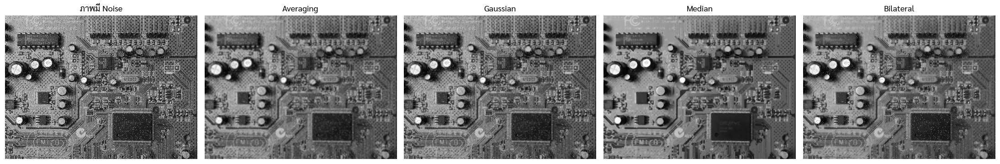

สังเกต: Median Filter กำจัด Salt & Pepper noise ได้ดีที่สุด
Bilateral Filter ลด noise พร้อมรักษาขอบภาพให้คมชัด แต่ประมวลผลช้ากว่าแบบอื่น


In [ ]:
# ===== เปรียบเทียบฟิลเตอร์ลด Noise 4 แบบ บนภาพที่มี Salt & Pepper Noise =====
kernel_size = (5, 5)

blur_averaging = cv2.blur(gray_sp_noisy, kernel_size)
blur_gaussian  = cv2.GaussianBlur(gray_sp_noisy, kernel_size, 0)
blur_median    = cv2.medianBlur(gray_sp_noisy, 5)
blur_bilateral = cv2.bilateralFilter(gray_sp_noisy, 9, 75, 75)

images = [gray_sp_noisy, blur_averaging, blur_gaussian, blur_median, blur_bilateral]
titles = ["ภาพมี Noise", "Averaging", "Gaussian", "Median", "Bilateral"]

fig, axes = plt.subplots(1, 5, figsize=(20, 5))
for ax, im, title in zip(axes, images, titles):
    ax.imshow(im, cmap="gray")
    ax.set_title(title)
    ax.axis("off")
plt.tight_layout()
plt.savefig("output/part3_filter_comparison.png", dpi=120)
plt.show()

print("สังเกต: Median Filter กำจัด Salt & Pepper noise ได้ดีที่สุด")
print("Bilateral Filter ลด noise พร้อมรักษาขอบภาพให้คมชัด แต่ประมวลผลช้ากว่าแบบอื่น")


### ตารางเลือกฟิลเตอร์

| เห็น noise แบบไหน | ใช้ฟิลเตอร์ไหน | ขนาด kernel แนะนำเริ่มต้น |
|---|---|---|
| เกล็ดละเอียดทั่วภาพ (Gaussian noise) แสงน้อย | Gaussian Filter | 3x3 หรือ 5x5 |
| จุดขาว-ดำกระจัดกระจาย (Salt & Pepper) | Median Filter | 3x3 |
| ต้องการลด noise แต่ต้องรักษาขอบชัดสำหรับวัดขนาด | Bilateral Filter | ปรับตามความเร็วที่ยอมรับได้ |
| ต้องการง่ายและเร็วที่สุด ไม่สนขอบเบลอ | Averaging (Mean) Filter | 3x3 |

**ในโรงงาน:** kernel ใหญ่เกินไปจะ "กลืน" ตำหนิเล็ก ๆ ที่เราต้องการหาไปด้วย เพราะตำหนิเล็กจะถูกเฉลี่ยจนจางหายไปเหมือน noise


### 🔧 ลองเปลี่ยนค่าดู
ลองเปลี่ยน `kernel_size` เป็น `(15, 15)` (ใหญ่มาก) แล้วสังเกตว่าภาพเบลอขึ้นมากแค่ไหน — นี่คือตัวอย่างของ "kernel ใหญ่เกินไป" ที่กล่าวถึงด้านบน


/tmp/ipykernel_810/1530366109.py:16: UserWarning: Glyph 10060 (\N{CROSS MARK}) missing from font(s) Sarabun.
  plt.tight_layout()
/tmp/ipykernel_810/1530366109.py:16: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) Sarabun.
  plt.tight_layout()
/tmp/ipykernel_810/1530366109.py:17: UserWarning: Glyph 10060 (\N{CROSS MARK}) missing from font(s) Sarabun.
  plt.savefig("output/part3_correct_order.png", dpi=120)
/tmp/ipykernel_810/1530366109.py:17: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) Sarabun.
  plt.savefig("output/part3_correct_order.png", dpi=120)
/usr/local/lib/python3.13/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 10060 (\N{CROSS MARK}) missing from font(s) Sarabun.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.13/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) Sarabun.
  fig.canvas.print_figure(bytes_io, **kw)


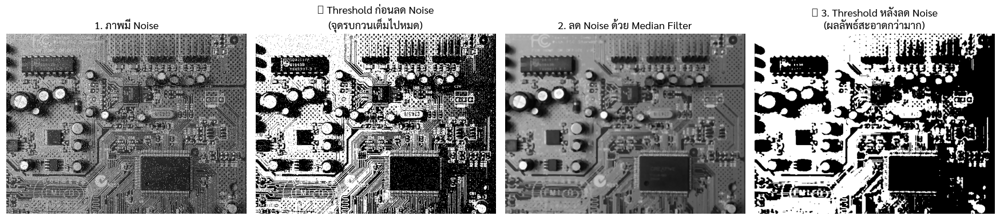

สรุป: ลำดับที่ถูกต้องคือ ลด noise (filtering) ก่อนเสมอ แล้วค่อยทำ thresholding
ถ้า threshold ก่อนลด noise, จุด noise ที่กระจายอยู่จะถูกตัดสินเป็นขาว/ดำปนไปกับวัตถุจริง


In [ ]:
# ===== สรุป: ลำดับที่ถูกต้อง — ลด Noise ก่อน แล้วค่อย Threshold =====
# ทำตามลำดับ: อ่านภาพ -> grayscale -> ลด noise (blur) -> threshold (Otsu) -> (ถ้าจำเป็น) morphology

# ทดลองทำผิดลำดับก่อน: threshold ตรง ๆ โดยไม่ลด noise
_, th_wrong_order = cv2.threshold(gray_sp_noisy, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

# ทำตามลำดับที่ถูกต้อง: ลด noise ด้วย median filter ก่อน แล้วค่อย threshold
denoised = cv2.medianBlur(gray_sp_noisy, 5)
_, th_correct_order = cv2.threshold(denoised, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

fig, axes = plt.subplots(1, 4, figsize=(16, 5))
axes[0].imshow(gray_sp_noisy, cmap="gray"); axes[0].set_title("1. ภาพมี Noise"); axes[0].axis("off")
axes[1].imshow(th_wrong_order, cmap="gray"); axes[1].set_title("❌ Threshold ก่อนลด Noise\n(จุดรบกวนเต็มไปหมด)"); axes[1].axis("off")
axes[2].imshow(denoised, cmap="gray"); axes[2].set_title("2. ลด Noise ด้วย Median Filter"); axes[2].axis("off")
axes[3].imshow(th_correct_order, cmap="gray"); axes[3].set_title("✅ 3. Threshold หลังลด Noise\n(ผลลัพธ์สะอาดกว่ามาก)"); axes[3].axis("off")
plt.tight_layout()
plt.savefig("output/part3_correct_order.png", dpi=120)
plt.show()

print("สรุป: ลำดับที่ถูกต้องคือ ลด noise (filtering) ก่อนเสมอ แล้วค่อยทำ thresholding")
print("ถ้า threshold ก่อนลด noise, จุด noise ที่กระจายอยู่จะถูกตัดสินเป็นขาว/ดำปนไปกับวัตถุจริง")


---
# สรุปท้ายไฟล์: บันทึกภาพ, ทดลองเปลี่ยนค่า, เช็คความเข้าใจ


In [ ]:
# ===== รวบรวมภาพผลลัพธ์ทั้งหมดที่บันทึกไว้ =====
import glob

saved_images = sorted(glob.glob("output/*.png") + glob.glob("output/*.jpg"))

print(f"บันทึกภาพผลลัพธ์ไว้ทั้งหมด {len(saved_images)} ไฟล์ ในโฟลเดอร์ output/:\n")
for path in saved_images:
    size_kb = os.path.getsize(path) / 1024
    print(f"  - {path} ({size_kb:.1f} KB)")

import shutil
shutil.make_archive("Module1_output_images", "zip", "output")
print("\nบีบอัดเป็นไฟล์ Module1_output_images.zip เรียบร้อย")
print("ดาวน์โหลดได้จากแถบไฟล์ทางซ้ายของ Colab (คลิกขวาที่ไฟล์ -> Download)")


บันทึกภาพผลลัพธ์ไว้ทั้งหมด 10 ไฟล์ ในโฟลเดอร์ output/:

  - output/board_copy.jpg (201.7 KB)
  - output/part2_bgr_vs_rgb.png (288.1 KB)
  - output/part3_adaptive_threshold.png (1189.9 KB)
  - output/part3_contrast_stretch.png (855.3 KB)
  - output/part3_correct_order.png (959.0 KB)
  - output/part3_filter_comparison.png (1086.7 KB)
  - output/part3_global_threshold_problem.png (765.9 KB)
  - output/part3_noise_types.png (1151.2 KB)
  - output/part3_otsu_threshold.png (658.5 KB)
  - output/part3_threshold_5types.png (1514.0 KB)

บีบอัดเป็นไฟล์ Module1_output_images.zip เรียบร้อย
ดาวน์โหลดได้จากแถบไฟล์ทางซ้ายของ Colab (คลิกขวาที่ไฟล์ -> Download)


In [4]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow

# 1. อ่านภาพต้นฉบับ
img = cv2.imread('/content/images/smarties.png')

# 2. เลือกสี (แปลงเป็น HSV และระบุช่วงสีเป้าหมาย)
hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
lower_color = np.array([10, 50, 50])    # ปรับช่วงสีตามชิ้นงานจริง
upper_color = np.array([25, 255, 255])

# 3. สร้าง Binary Mask (วัตถุ=ขาว, พื้นหลัง=ดำ)
mask = cv2.inRange(hsv, lower_color, upper_color)

# 4. กรองจุดรบกวน (Morphology: Opening + Closing)
kernel = np.ones((5, 5), np.uint8)
mask_open = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel)      # ลบ Noise เล็กๆ ข้างนอก
mask_clean = cv2.morphologyEx(mask_open, cv2.MORPH_CLOSE, kernel) # ปิดรูโหว่ข้างใน

# 5. นับจำนวนวัตถุและวาดกรอบ (Connected Components)
num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(mask_clean)

output_img = img.copy()
valid_object_count = 0

# วนลูปตรวจสอบแต่ละชิ้นงาน (ข้าม index 0 ซึ่งเป็น Background)
for i in range(1, num_labels):
    x, y, w, h, area = stats[i]

    # กรองเฉพาะชิ้นงานที่มีขนาดพื้นที่ (Area) ตามเกณฑ์ที่กำหนด
    if area > 1000:
        valid_object_count += 1
        # วาดกรอบ Bounding Box และใส่หมายเลขชิ้นงาน
        cv2.rectangle(output_img, (x, y), (x + w, y + h), (0, 255, 0), 2)
        cv2.putText(output_img, f"#{valid_object_count}", (x, y - 10),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 255, 0), 2)

print(f"จำนวนชิ้นงานที่พบ: {valid_object_count} ชิ้น")

# แสดงผลลัพธ์
cv2.imshow('Clean Mask', mask_clean)
cv2.imshow('Result', output_img)
cv2.waitKey(0)
cv2.destroyAllWindows()

จำนวนชิ้นงานที่พบ: 0 ชิ้น


DisabledFunctionError: cv2.imshow() is disabled in Colab, because it causes Jupyter sessions
to crash; see https://github.com/jupyter/notebook/issues/3935.
As a substitution, consider using
  from google.colab.patches import cv2_imshow


## 🔧 สรุปจุดที่ให้ลองเปลี่ยนค่าดูตลอดทั้งไฟล์นี้

| Part | จุดที่ลองเปลี่ยนค่า |
|---|---|
| Part 1 | ค่า `defect_score` ใน if-else, เพิ่มชื่อชิ้นงานใน list ของ for loop |
| Part 2 | เปลี่ยนไฟล์ภาพที่อ่าน (`board.jpg` → `baboon.jpg` / `fruits.jpg`) |
| Part 3 | ค่า `T` ใน threshold, `blockSize` ใน adaptive threshold, `kernel_size` ใน filtering |

หากยังมีเวลาเหลือ ลองย้อนกลับไปเปลี่ยนค่าตามตารางนี้อีกครั้งเพื่อทำความเข้าใจให้แน่นขึ้นก่อนไป Module 2


## เช็คความเข้าใจก่อนจบ Module 1 (ทั้ง 3 Part)

ลองตอบคำถามต่อไปนี้ด้วยตัวเอง (ไม่ต้องส่งคำตอบ):

1. ตัวแปรคืออะไร ยกตัวอย่างชนิดข้อมูล 1 ชนิดที่เรียนไปวันนี้
2. ทำไมต้องใช้ `cv2_imshow()` แทน `cv2.imshow()` บน Google Colab
3. ภาพสีมีกี่แชนแนล อะไรบ้าง และ OpenCV อ่านลำดับสีแบบ BGR หรือ RGB
4. Thresholding คืออะไร และต่างจาก Adaptive Thresholding อย่างไร
5. ทำไมควรลด noise (filtering) ก่อนทำ thresholding เสมอ

ถ้าตอบข้อไหนไม่ได้ ให้เลื่อนกลับไปอ่านเซลล์ที่เกี่ยวข้อง หรือสอบถามวิทยากรได้ทันที

---

**ต่อไปคือ Module 2:** Computer Vision Concepts — Object Detection และการเตรียม Dataset
